<a href="https://colab.research.google.com/github/ew23abo/MSc-Final-Year-Project/blob/main/CNN_model_inspired_by_MM_SEN_(Multi_scale_Multi_head_Self_attention_Ensemble_Network)_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install --upgrade tensorflow tensorflow-datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 54.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 94.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 93.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 91.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 3.5 MB/s eta 0:00:00


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/patch_camelyon/incomplete.S4G9GM_2.0.0/patch_camelyon-test.tfrecord*...:  …

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/patch_camelyon/incomplete.S4G9GM_2.0.0/patch_camelyon-train.tfrecord*...: …

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/patch_camelyon/incomplete.S4G9GM_2.0.0/patch_camelyon-validation.tfrecord*…

Dataset patch_camelyon downloaded and prepared to /root/tensorflow_datasets/patch_camelyon/2.0.0. Subsequent calls will reuse this data.
Dataset Info:
tfds.core.DatasetInfo(
    name='patch_camelyon',
    full_name='patch_camelyon/2.0.0',
    description="""
    The PatchCamelyon benchmark is a new and challenging image classification
    dataset. It consists of 327.680 color images (96 x 96px) extracted from
    histopathologic scans of lymph node sections. Each image is annoted with a
    binary label indicating presence of metastatic tissue. PCam provides a new
    benchmark for machine learning models: bigger than CIFAR10, smaller than
    Imagenet, trainable on a single GPU.
    """,
    homepage='https://patchcamelyon.grand-challenge.org/',
    data_dir='/root/tensorflow_datasets/patch_camelyon/2.0.0',
    file_format=tfrecord,
    download_size=7.48 GiB,
    dataset_size=7.06 GiB,
    features=FeaturesDict({
        'id': Text(shape=(), dtype=string),
        'image': Image(shap

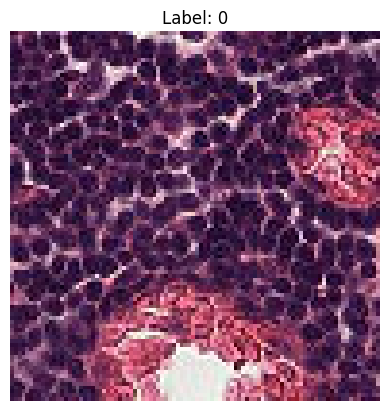

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

# Enable memory growth for GPUs (avoid crashes)
physical_devices = tf.config.list_physical_devices('GPU')
for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

# Load PatchCamelyon dataset efficiently
(ds_train, ds_validation, ds_test), ds_info = tfds.load(
    'patch_camelyon',
    split=['train[:80%]', 'train[80%:]', 'validation'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True,
)

# Verify loaded dataset
print(f"Dataset Info:\n{ds_info}")

# Example: view a sample image
import matplotlib.pyplot as plt

def show_sample(image, label):
    plt.imshow(image.numpy())
    plt.title(f"Label: {label.numpy()}")
    plt.axis('off')

for image, label in ds_train.take(1):
    show_sample(image, label)


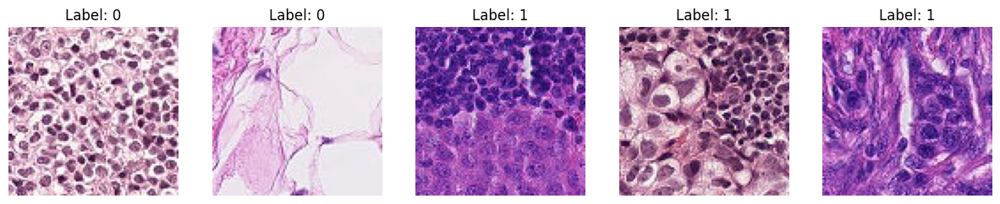

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds

# Load the dataset
ds_train, ds_info = tfds.load('patch_camelyon', split='train', with_info=True, as_supervised=True)

# Display 5 sample images with labels
plt.figure(figsize=(15, 3))
for i, (image, label) in enumerate(ds_train.take(5)):
    plt.subplot(1, 5, i + 1)
    plt.imshow(image.numpy())
    plt.title(f'Label: {label.numpy()}')
    plt.axis('off')

plt.show()


tfds.core.DatasetInfo(
    name='patch_camelyon',
    full_name='patch_camelyon/2.0.0',
    description="""
    The PatchCamelyon benchmark is a new and challenging image classification
    dataset. It consists of 327.680 color images (96 x 96px) extracted from
    histopathologic scans of lymph node sections. Each image is annoted with a
    binary label indicating presence of metastatic tissue. PCam provides a new
    benchmark for machine learning models: bigger than CIFAR10, smaller than
    Imagenet, trainable on a single GPU.
    """,
    homepage='https://patchcamelyon.grand-challenge.org/',
    data_dir='/root/tensorflow_datasets/patch_camelyon/2.0.0',
    file_format=tfrecord,
    download_size=7.48 GiB,
    dataset_size=7.06 GiB,
    features=FeaturesDict({
        'id': Text(shape=(), dtype=string),
        'image': Image(shape=(96, 96, 3), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    dis

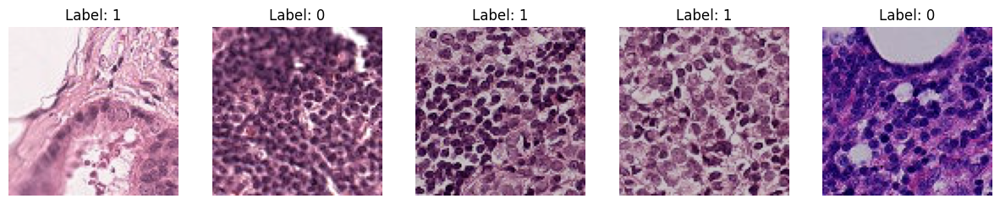

In [ ]:
# Import necessary libraries
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

# Enable GPU memory growth to avoid runtime crashes
physical_devices = tf.config.list_physical_devices('GPU')
for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

# Load PCam dataset with 80% train and 20% test split
(ds_train, ds_test), ds_info = tfds.load(
    'patch_camelyon',
    split=['train[:80%]', 'train[80%:]'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True,
)

# Verify dataset info
print(ds_info)

# Define preprocessing and augmentation functions
def preprocess(image, label):
    # Normalise images to [0, 1]
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize images to ensure consistent input size (if required by your models)
    image = tf.image.resize(image, [96, 96])
    return image, label

# Augmentation function according to PDM plan (rotation, flip, contrast)

def augment(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    image = tf.image.rot90(image, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))
    image = tf.clip_by_value(image, 0.0, 1.0)  # Ensure pixel values are within [0,1]
    return image, label

# Apply preprocessing, augmentation, batching, caching, and prefetching
batch_size = 64

# Training dataset pipeline
ds_train = (
    ds_train
    .map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    .map(augment, num_parallel_calls=tf.data.AUTOTUNE)
    .cache()
    .shuffle(1000)
    .batch(batch_size)
    .prefetch(tf.data.AUTOTUNE)
)

# Test dataset pipeline (no augmentation, just preprocessing)
ds_test = (
    ds_test
    .map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(batch_size)
    .cache()
    .prefetch(tf.data.AUTOTUNE)
)

# Check a batch of training images
for images, labels in ds_train.take(1):
    plt.figure(figsize=(15, 5))
    for i in range(5):
        plt.subplot(1, 5, i+1)
        plt.imshow(images[i].numpy())
        plt.title(f'Label: {labels[i].numpy()}')
        plt.axis('off')
    plt.show()


In [ ]:
from tensorflow.keras.layers import Input, Conv2D, GlobalAveragePooling2D, Dense, Concatenate, Multiply, Activation, Reshape
from tensorflow.keras.models import Model

def simple_attention_block(x):
    channels = x.shape[-1]
    attention = GlobalAveragePooling2D()(x)
    attention = Dense(channels//4, activation='relu')(attention)
    attention = Dense(channels, activation='sigmoid')(attention)
    attention = Reshape((1, 1, channels))(attention)
    return Multiply()([x, attention])

input_layer = Input(shape=(96, 96, 3))

# Multi-scale convolutional branches
branch1 = Conv2D(32, (3,3), activation='relu', padding='same')(input_layer)
branch2 = Conv2D(32, (5,5), activation='relu', padding='same')(input_layer)
branch3 = Conv2D(32, (7,7), activation='relu', padding='same')(input_layer)

# Combine branches
combined = Concatenate()([branch1, branch2, branch3])

# Apply attention
attention_output = simple_attention_block(combined)

# Pooling and classification
x = GlobalAveragePooling2D()(attention_output)
output_layer = Dense(1, activation='sigmoid')(x)

# Define model
custom_mmsen_model = Model(inputs=input_layer, outputs=output_layer)

# Compile model clearly
custom_mmsen_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# Model summary
custom_mmsen_model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 96, 96, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 96, 96, 32)     │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 96, 96, 32)     │          2,432 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 96, 96, 32)     │          4,736 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 96, 96, 96)     │              0 │ conv2d[0][0],          │
│                           │                        │                │ conv2d_1[0][0],        │
│                           │                        │                │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d  │ (None, 96)             │              0 │ concatenate[0][0]      │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 24)             │          2,328 │ global_average_poolin… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 96)             │          2,400 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 1, 1, 96)       │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply (Multiply)       │ (None, 96, 96, 96)     │              0 │ concatenate[0][0],     │
│                           │                        │                │ reshape[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d… │ (None, 96)             │              0 │ multiply[0][0]         │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 1)              │             97 │ global_average_poolin… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 12,889 (50.35 KB)

 Trainable params: 12,889 (50.35 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history_custom_mmsen = custom_mmsen_model.fit(
    ds_train,
    epochs=20,
    validation_data=ds_test
)

Epoch 1/20
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1222s 372ms/step - accuracy: 0.6738 - auc: 0.7397 - loss: 0.5984 - val_accuracy: 0.7597 - val_auc: 0.8347 - val_loss: 0.5113
Epoch 2/20
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1129s 344ms/step - accuracy: 0.7371 - auc: 0.8090 - loss: 0.5352 - val_accuracy: 0.7657 - val_auc: 0.8435 - val_loss: 0.4958
Epoch 3/20
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1149s 350ms/step - accuracy: 0.7511 - auc: 0.8242 - loss: 0.5159 - val_accuracy: 0.7752 - val_auc: 0.8632 - val_loss: 0.4891
Epoch 4/20
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1159s 354ms/step - accuracy: 0.7619 - auc: 0.8386 - loss: 0.4974 - val_accuracy: 0.7858 - val_auc: 0.8696 - val_loss: 0.4573
Epoch 5/20
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1171s 357ms/step - accuracy: 0.7724 - auc: 0.8497 - loss: 0.4822 - val_accuracy: 0.7930 - val_auc: 0.8745 - val_loss: 0.4560
Epoch 6/20
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1175s 359ms/step - accuracy: 0.7770 - auc: 0.8539 - loss: 0.4762 - val_accuracy: 0.7976 - val_auc: 0.8814 - val_loss: 0.440

In [ ]:
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Reshape, Multiply

def simple_attention_block(x):
    channels = x.shape[-1]  # explicitly defining 'channels' based on input tensor 'x'
    attention = GlobalAveragePooling2D()(x)
    attention = Dense(channels // 2, activation='relu')(attention)  # your modified line
    attention = Dense(channels, activation='sigmoid')(attention)
    attention = Reshape((1, 1, channels))(attention)
    return Multiply()([x, attention])


In [ ]:
# Fine-tune the custom model (additional 10 epochs with lower learning rate)

# Adjust the learning rate for stable fine-tuning
custom_mmsen_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# Fine-tuning training
history_finetune_custom_mmsen = custom_mmsen_model.fit(
    ds_train,
    epochs=10,
    validation_data=ds_test
)

Epoch 1/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1365s 415ms/step - accuracy: 0.8213 - auc: 0.9032 - loss: 0.3943 - val_accuracy: 0.8338 - val_auc: 0.9148 - val_loss: 0.3745
Epoch 2/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1357s 414ms/step - accuracy: 0.8233 - auc: 0.9047 - loss: 0.3911 - val_accuracy: 0.8331 - val_auc: 0.9153 - val_loss: 0.3737
Epoch 3/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1357s 414ms/step - accuracy: 0.8237 - auc: 0.9051 - loss: 0.3901 - val_accuracy: 0.8340 - val_auc: 0.9154 - val_loss: 0.3725
Epoch 4/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1355s 413ms/step - accuracy: 0.8238 - auc: 0.9052 - loss: 0.3898 - val_accuracy: 0.8340 - val_auc: 0.9156 - val_loss: 0.3723
Epoch 5/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1358s 414ms/step - accuracy: 0.8242 - auc: 0.9054 - loss: 0.3893 - val_accuracy: 0.8345 - val_auc: 0.9158 - val_loss: 0.3714
Epoch 6/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1357s 414ms/step - accuracy: 0.8244 - auc: 0.9056 - loss: 0.3889 - val_accuracy: 0.8338 - val_auc: 0.9160 - val_loss: 0.371

In [ ]:
# Required imports for visualisation and evaluation
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Function to plot training curves
def plot_training_curves(history):
    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    plt.plot(history.history['accuracy'], label='Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(history.history['auc'], label='AUC')
    plt.plot(history.history['val_auc'], label='Validation AUC')
    plt.title('AUC-ROC')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.legend()

    plt.show()

In [ ]:
# Function to evaluate model performance
def evaluate_model(model, dataset):
    y_true, y_pred = [], []
    for images, labels in dataset:
        predictions = model.predict(images)
        predictions = np.round(predictions).astype(int)
        y_true.extend(labels.numpy())
        y_pred.extend(predictions.flatten())

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)

    print("\nCustom MM-SEN-Inspired Model Evaluation Metrics:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"AUC-ROC: {auc:.4f}")

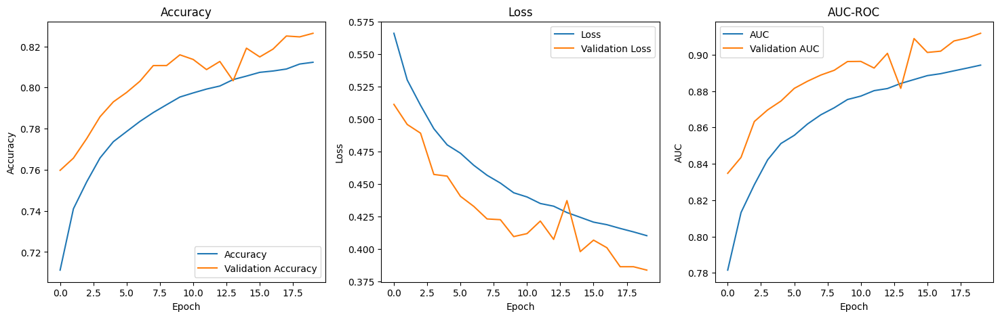

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━

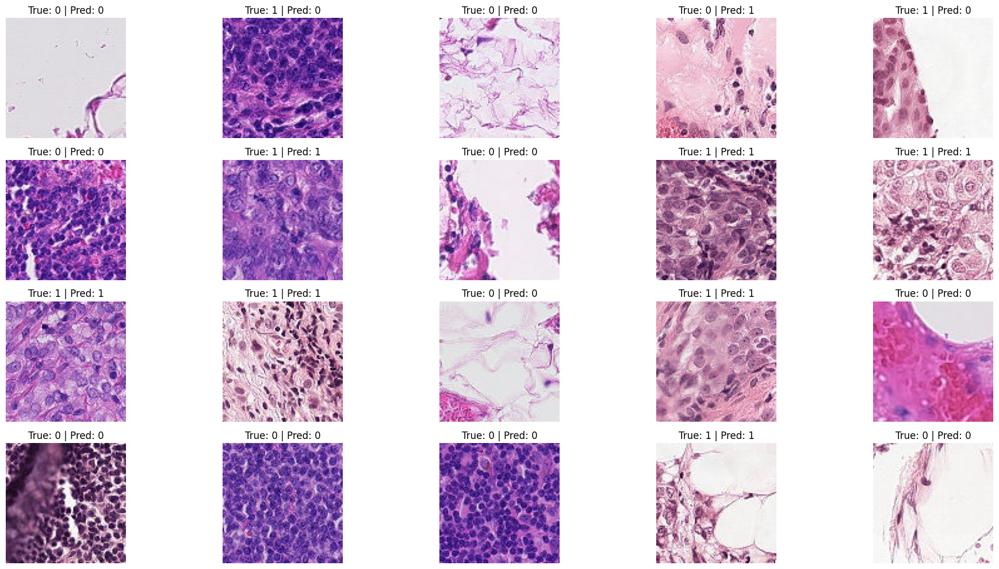

In [ ]:
# Function to visualise model predictions on test images
def visualize_predictions(model, dataset, num_images=20):
    plt.figure(figsize=(20, 10))
    images_shown = 0

    for images, labels in dataset:
        predictions = model.predict(images)
        predictions_rounded = np.round(predictions).astype(int).flatten()

        for i in range(images.shape[0]):
            plt.subplot(4, 5, images_shown + 1)
            plt.imshow(images[i].numpy())
            plt.title(f"True: {labels.numpy()[i]} | Pred: {predictions_rounded[i]}")
            plt.axis('off')
            images_shown += 1

            if images_shown >= num_images:
                plt.tight_layout()
                plt.show()
                return

# Execute clearly after training
plot_training_curves(history_custom_mmsen)
evaluate_model(custom_mmsen_model, ds_test)
visualize_predictions(custom_mmsen_model, ds_test, num_images=20)

In [ ]:
# Required imports for visualisation and evaluation
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Function to plot training curves
def plot_training_curves(history):
    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    plt.plot(history.history['accuracy'], label='Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(history.history['auc'], label='AUC')
    plt.plot(history.history['val_auc'], label='Validation AUC')
    plt.title('AUC-ROC')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.legend()

    plt.show()

# Function to evaluate model performance
def evaluate_model(model, dataset):
    y_true, y_pred = [], []
    for images, labels in dataset:
        predictions = model.predict(images)
        predictions = np.round(predictions).astype(int)
        y_true.extend(labels.numpy())
        y_pred.extend(predictions.flatten())

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)

    print("\nCustom MM-SEN-Inspired Model Evaluation Metrics:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"AUC-ROC: {auc:.4f}")

# Function to visualise model predictions on test images
def visualize_predictions(model, dataset, num_images=20):
    plt.figure(figsize=(20, 10))
    images_shown = 0

    for images, labels in dataset:
        predictions = model.predict(images)
        predictions_rounded = np.round(predictions).astype(int).flatten()

        for i in range(images.shape[0]):
            plt.subplot(4, 5, images_shown + 1)
            plt.imshow(images[i].numpy())
            plt.title(f"True: {labels.numpy()[i]} | Pred: {predictions_rounded[i]}")
            plt.axis('off')
            images_shown += 1

            if images_shown >= num_images:
                plt.tight_layout()
                plt.show()
                return

# Further fine-tuning the custom model (additional 10 epochs with even lower learning rate)
custom_mmsen_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-6),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# Execute further fine-tuning
history_finetune_extended = custom_mmsen_model.fit(
    ds_train,
    epochs=10,
    validation_data=ds_test
)

# Evaluate and visualize clearly after additional fine-tuning
plot_training_curves(history_finetune_extended)
evaluate_model(custom_mmsen_model, ds_test)
visualize_predictions(custom_mmsen_model, ds_test, num_images=20)


Epoch 1/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1362s 415ms/step - accuracy: 0.8262 - auc: 0.9073 - loss: 0.3856 - val_accuracy: 0.8368 - val_auc: 0.9175 - val_loss: 0.3680
Epoch 2/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1359s 415ms/step - accuracy: 0.8265 - auc: 0.9072 - loss: 0.3857 - val_accuracy: 0.8367 - val_auc: 0.9177 - val_loss: 0.3679
Epoch 3/10
1918/3277 ━━━━━━━━━━━━━━━━━━━━ 8:45 387ms/step - accuracy: 0.8265 - auc: 0.9074 - loss: 0.3855

In [ ]:
# Required imports for visualisation and evaluation
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Function to plot training curves
def plot_training_curves(history):
    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    plt.plot(history.history['accuracy'], label='Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(history.history['loss'], label='Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(history.history['auc'], label='AUC')
    plt.plot(history.history['val_auc'], label='Validation AUC')
    plt.title('AUC-ROC')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.legend()

    plt.show()

# Function to visualise model predictions on test images
def visualize_predictions(model, dataset, num_images=20):
    plt.figure(figsize=(20, 10))
    images_shown = 0

    for images, labels in dataset:
        predictions = model.predict(images)
        predictions_rounded = np.round(predictions).astype(int).flatten()

        for i in range(images.shape[0]):
            plt.subplot(4, 5, images_shown + 1)
            plt.imshow(images[i].numpy())
            plt.title(f"True: {labels.numpy()[i]} | Pred: {predictions_rounded[i]}")
            plt.axis('off')
            images_shown += 1

            if images_shown >= num_images:
                plt.tight_layout()
                plt.show()
                return

In [ ]:

# Function to evaluate model performance
def evaluate_model(model, dataset):
    y_true, y_pred = [], []
    for images, labels in dataset:
        predictions = model.predict(images)
        predictions = np.round(predictions).astype(int)
        y_true.extend(labels.numpy())
        y_pred.extend(predictions.flatten())

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)

    print("\nCustom MM-SEN-Inspired Model Evaluation Metrics:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print(f"AUC-ROC: {auc:.4f}")

# Install and Import Libraries

In [ ]:
# Install necessary packages
!pip install --upgrade tensorflow tensorflow-datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 186.4 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.5/24.5 MB 52.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 76.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 88.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 100.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.5/72.5 kB 4.2 MB/s eta 0:00:00


In [ ]:
# Import libraries
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Load and Preprocess the Dataset

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/3 [00:00<?, ? splits/s]

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/patch_camelyon/incomplete.H3C7C5_2.0.0/patch_camelyon-test.tfrecord*...:  …

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/patch_camelyon/incomplete.H3C7C5_2.0.0/patch_camelyon-train.tfrecord*...: …

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/patch_camelyon/incomplete.H3C7C5_2.0.0/patch_camelyon-validation.tfrecord*…

Dataset patch_camelyon downloaded and prepared to /root/tensorflow_datasets/patch_camelyon/2.0.0. Subsequent calls will reuse this data.
Dataset Info:
tfds.core.DatasetInfo(
    name='patch_camelyon',
    full_name='patch_camelyon/2.0.0',
    description="""
    The PatchCamelyon benchmark is a new and challenging image classification
    dataset. It consists of 327.680 color images (96 x 96px) extracted from
    histopathologic scans of lymph node sections. Each image is annoted with a
    binary label indicating presence of metastatic tissue. PCam provides a new
    benchmark for machine learning models: bigger than CIFAR10, smaller than
    Imagenet, trainable on a single GPU.
    """,
    homepage='https://patchcamelyon.grand-challenge.org/',
    data_dir='/root/tensorflow_datasets/patch_camelyon/2.0.0',
    file_format=tfrecord,
    download_size=7.48 GiB,
    dataset_size=7.06 GiB,
    features=FeaturesDict({
        'id': Text(shape=(), dtype=string),
        'image': Image(shap

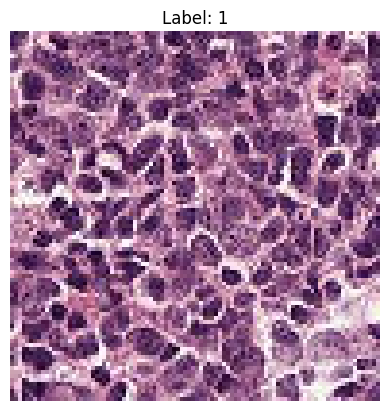

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

# Enable memory growth for GPUs (avoid crashes)
physical_devices = tf.config.list_physical_devices('GPU')
for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

# Load PatchCamelyon dataset efficiently
(ds_train, ds_validation, ds_test), ds_info = tfds.load(
    'patch_camelyon',
    split=['train[:80%]', 'train[80%:]', 'validation'],
    shuffle_files=True,
    as_supervised=True,
    with_info=True,
)

# Verify loaded dataset
print(f"Dataset Info:\n{ds_info}")

# Example: view a sample image
import matplotlib.pyplot as plt

def show_sample(image, label):
    plt.imshow(image.numpy())
    plt.title(f"Label: {label.numpy()}")
    plt.axis('off')

for image, label in ds_train.take(1):
    show_sample(image, label)


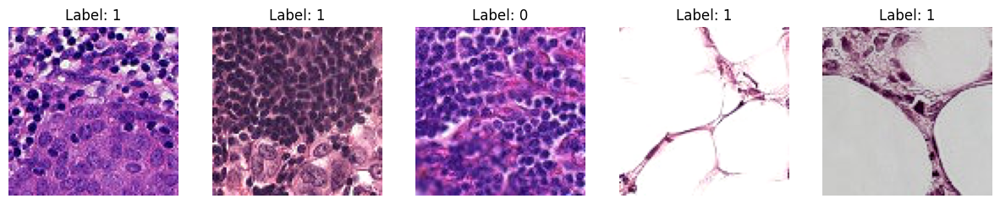

In [ ]:
# Define preprocessing and augmentation functions
def preprocess(image, label):
    # Normalise images to [0, 1]
    image = tf.image.convert_image_dtype(image, tf.float32)
    # Resize images to ensure consistent input size (if required by your models)
    image = tf.image.resize(image, [96, 96])
    return image, label

# Augmentation function according to PDM plan (rotation, flip, contrast)

def augment(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_flip_up_down(image)
    image = tf.image.random_brightness(image, max_delta=0.2)
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2)
    image = tf.image.rot90(image, k=tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32))
    image = tf.clip_by_value(image, 0.0, 1.0)  # Ensure pixel values are within [0,1]
    return image, label

# Apply preprocessing, augmentation, batching, caching, and prefetching
batch_size = 64

# Training dataset pipeline
ds_train = (
    ds_train
    .map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    .map(augment, num_parallel_calls=tf.data.AUTOTUNE)
    .cache()
    .shuffle(1000)
    .batch(batch_size)
    .prefetch(tf.data.AUTOTUNE)
)

# Test dataset pipeline (no augmentation, just preprocessing)
ds_test = (
    ds_test
    .map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(batch_size)
    .cache()
    .prefetch(tf.data.AUTOTUNE)
)

# Check a batch of training images
for images, labels in ds_train.take(1):
    plt.figure(figsize=(15, 5))
    for i in range(5):
        plt.subplot(1, 5, i+1)
        plt.imshow(images[i].numpy())
        plt.title(f'Label: {labels[i].numpy()}')
        plt.axis('off')
    plt.show()


# Define the Custom MM-SEN-Inspired Model

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, GlobalAveragePooling2D, Dense, Concatenate, Multiply, Reshape
from tensorflow.keras.models import Model

def simple_attention_block(x):
    channels = x.shape[-1]
    attention = GlobalAveragePooling2D()(x)
    attention = Dense(channels // 2, activation='relu')(attention)
    attention = Dense(channels, activation='sigmoid')(attention)
    attention = Reshape((1, 1, channels))(attention)
    return Multiply()([x, attention])

input_layer = Input(shape=(96, 96, 3))

branch1 = Conv2D(32, (3,3), activation='relu', padding='same')(input_layer)
branch2 = Conv2D(32, (5,5), activation='relu', padding='same')(input_layer)
branch3 = Conv2D(32, (7,7), activation='relu', padding='same')(input_layer)

combined = Concatenate()([branch1, branch2, branch3])
attention_output = simple_attention_block(combined)
x = GlobalAveragePooling2D()(attention_output)
output_layer = Dense(1, activation='sigmoid')(x)

custom_mmsen_model = Model(inputs=input_layer, outputs=output_layer)
custom_mmsen_model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 96, 96, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 96, 96, 32)     │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 96, 96, 32)     │          2,432 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 96, 96, 32)     │          4,736 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 96, 96, 96)     │              0 │ conv2d[0][0],          │
│                           │                        │                │ conv2d_1[0][0],        │
│                           │                        │                │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d  │ (None, 96)             │              0 │ concatenate[0][0]      │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 48)             │          4,656 │ global_average_poolin… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 96)             │          4,704 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 1, 1, 96)       │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply (Multiply)       │ (None, 96, 96, 96)     │              0 │ concatenate[0][0],     │
│                           │                        │                │ reshape[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d… │ (None, 96)             │              0 │ multiply[0][0]         │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 1)              │             97 │ global_average_poolin… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 17,521 (68.44 KB)

 Trainable params: 17,521 (68.44 KB)

 Non-trainable params: 0 (0.00 B)

# Compile and Train the Model (40 epochs)

In [ ]:
custom_mmsen_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# Train for 40 epochs
history_custom_mmsen = custom_mmsen_model.fit(
    ds_train,
    epochs=40,
    validation_data=ds_test
)

Epoch 1/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1191s 363ms/step - accuracy: 0.6820 - auc: 0.7491 - loss: 0.5904 - val_accuracy: 0.7229 - val_auc: 0.7979 - val_loss: 0.5564
Epoch 2/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1101s 336ms/step - accuracy: 0.7417 - auc: 0.8150 - loss: 0.5279 - val_accuracy: 0.7409 - val_auc: 0.8388 - val_loss: 0.5216
Epoch 3/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1116s 341ms/step - accuracy: 0.7536 - auc: 0.8295 - loss: 0.5093 - val_accuracy: 0.7617 - val_auc: 0.8469 - val_loss: 0.4928
Epoch 4/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1134s 346ms/step - accuracy: 0.7652 - auc: 0.8423 - loss: 0.4923 - val_accuracy: 0.7664 - val_auc: 0.8605 - val_loss: 0.4943
Epoch 5/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1143s 349ms/step - accuracy: 0.7727 - auc: 0.8502 - loss: 0.4814 - val_accuracy: 0.7456 - val_auc: 0.8495 - val_loss: 0.5079
Epoch 6/40
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1155s 352ms/step - accuracy: 0.7774 - auc: 0.8564 - loss: 0.4723 - val_accuracy: 0.7874 - val_auc: 0.8767 - val_loss: 0.445

# Visualisation and Evaluation After Initial Training

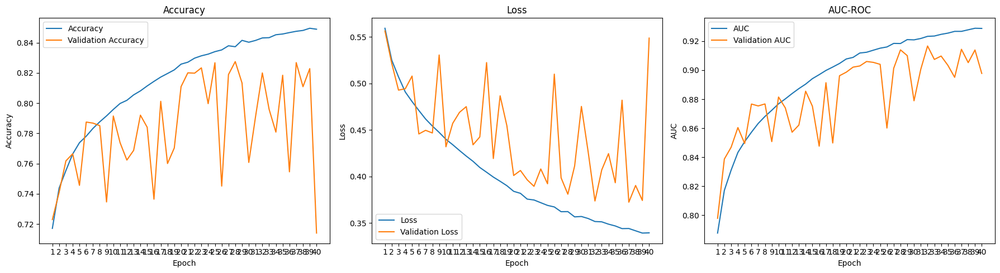

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step 
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━

In [ ]:
# Plotting function
import matplotlib.pyplot as plt
import numpy as np

def plot_training_curves(history):
    epochs = np.arange(1, len(history.history['accuracy']) + 1)

    plt.figure(figsize=(18, 5))

    plt.subplot(1, 3, 1)
    plt.plot(epochs, history.history['accuracy'], label='Accuracy')
    plt.plot(epochs, history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.xticks(epochs)
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(epochs, history.history['loss'], label='Loss')
    plt.plot(epochs, history.history['val_loss'], label='Validation Loss')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.xticks(epochs)
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(epochs, history.history['auc'], label='AUC')
    plt.plot(epochs, history.history['val_auc'], label='Validation AUC')
    plt.title('AUC-ROC')
    plt.xlabel('Epoch')
    plt.ylabel('AUC')
    plt.xticks(epochs)
    plt.legend()

    plt.tight_layout()
    plt.show()

# Evaluation function
def evaluate_model(model, dataset):
    y_true, y_pred = [], []
    for images, labels in dataset:
        preds = model.predict(images)
        preds = np.round(preds).astype(int).flatten()
        y_true.extend(labels.numpy())
        y_pred.extend(preds)

    print("Accuracy:", accuracy_score(y_true, y_pred))
    print("Precision:", precision_score(y_true, y_pred))
    print("Recall:", recall_score(y_true, y_pred))
    print("F1 Score:", f1_score(y_true, y_pred))
    print("AUC-ROC:", roc_auc_score(y_true, y_pred))

# Run evaluation and visualisation
plot_training_curves(history_custom_mmsen)
evaluate_model(custom_mmsen_model, ds_test)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step


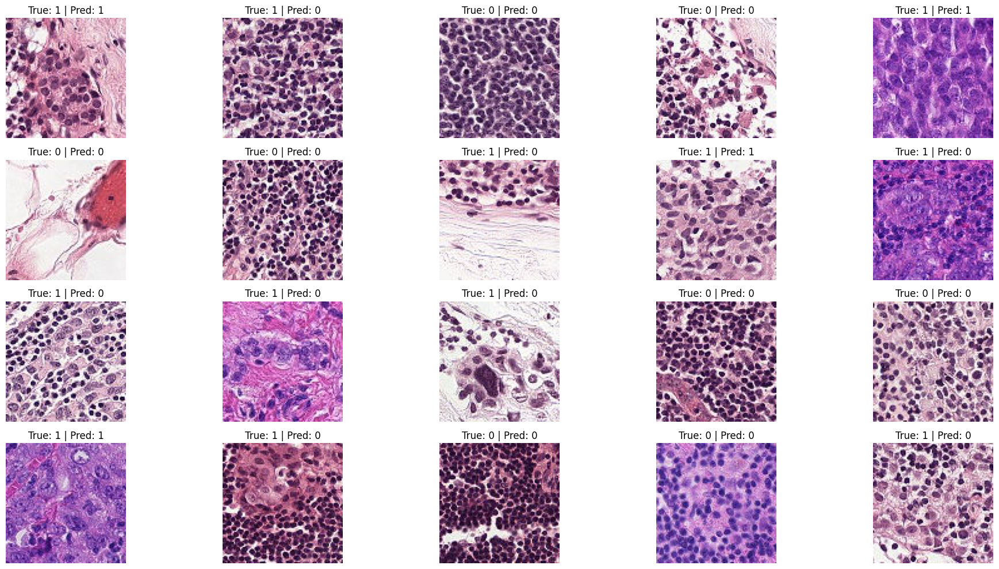

In [ ]:
# Function to visualise predictions on 20 test images clearly
def visualize_predictions(model, dataset, num_images=20):
    plt.figure(figsize=(20, 10))
    images_shown = 0
    for images, labels in dataset:
        predictions = model.predict(images)
        preds_rounded = np.round(predictions).astype(int).flatten()

        for i in range(images.shape[0]):
            plt.subplot(4, 5, images_shown + 1)
            plt.imshow(images[i].numpy())
            plt.title(f"True: {labels.numpy()[i]} | Pred: {preds_rounded[i]}")
            plt.axis('off')

            images_shown += 1
            if images_shown >= num_images:
                plt.tight_layout()
                plt.show()
                return

# Execute clearly after your training and evaluation
visualize_predictions(custom_mmsen_model, ds_test, num_images=20)


 # Fine-tuning (Further 10 epochs)

In [ ]:
# Lower learning rate and fine-tune
custom_mmsen_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-6),
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# Further training
history_finetune_custom_mmsen = custom_mmsen_model.fit(
    ds_train,
    epochs=10,
    validation_data=ds_test
)

Epoch 1/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1324s 403ms/step - accuracy: 0.8572 - auc: 0.9371 - loss: 0.3249 - val_accuracy: 0.8176 - val_auc: 0.9146 - val_loss: 0.3792
Epoch 2/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1316s 402ms/step - accuracy: 0.8641 - auc: 0.9405 - loss: 0.3127 - val_accuracy: 0.8161 - val_auc: 0.9147 - val_loss: 0.3799
Epoch 3/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1316s 402ms/step - accuracy: 0.8648 - auc: 0.9411 - loss: 0.3111 - val_accuracy: 0.8159 - val_auc: 0.9145 - val_loss: 0.3804
Epoch 4/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1317s 402ms/step - accuracy: 0.8653 - auc: 0.9413 - loss: 0.3103 - val_accuracy: 0.8143 - val_auc: 0.9141 - val_loss: 0.3835
Epoch 5/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1314s 401ms/step - accuracy: 0.8654 - auc: 0.9415 - loss: 0.3098 - val_accuracy: 0.8153 - val_auc: 0.9141 - val_loss: 0.3819
Epoch 6/10
3277/3277 ━━━━━━━━━━━━━━━━━━━━ 1316s 402ms/step - accuracy: 0.8655 - auc: 0.9416 - loss: 0.3094 - val_accuracy: 0.8153 - val_auc: 0.9141 - val_loss: 0.382

# Final Evaluation and Visualisation After Fine-tuning

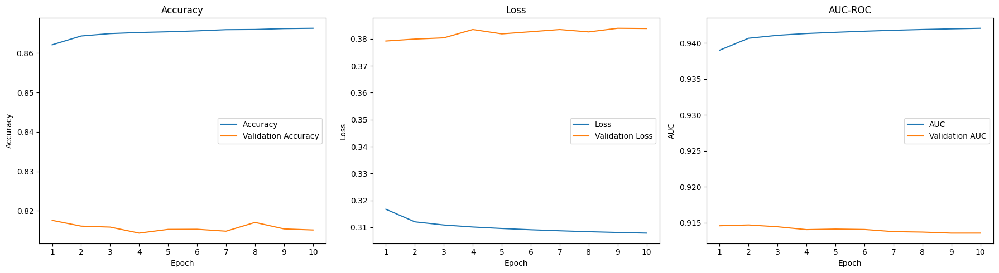

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━

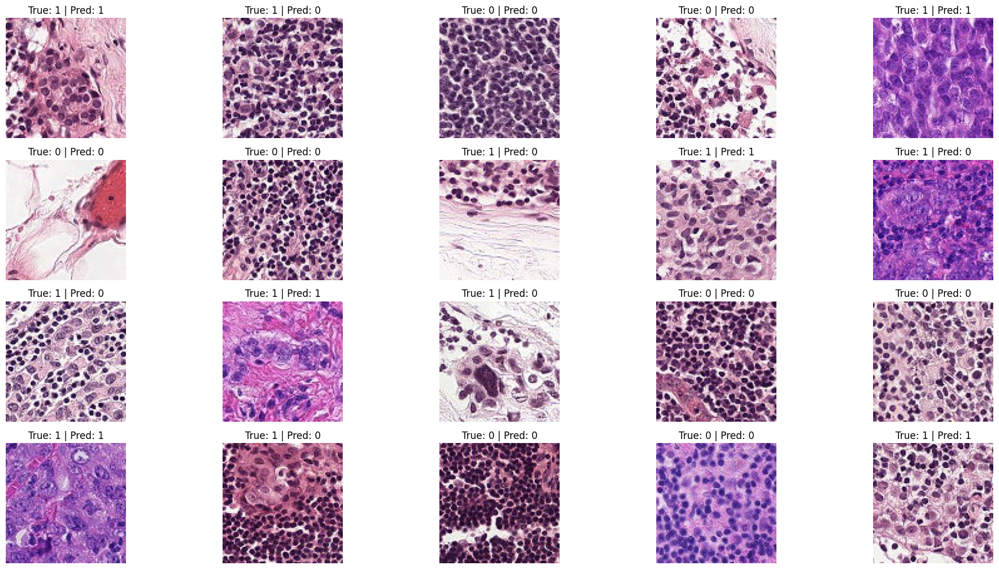

In [ ]:
# Evaluate and visualise after fine-tuning (additional 10 epochs)
plot_training_curves(history_finetune_custom_mmsen)
evaluate_model(custom_mmsen_model, ds_test)

# Clearly visualise predictions on 20 test images after fine-tuning
def visualize_predictions(model, dataset, num_images=20):
    plt.figure(figsize=(20, 10))
    images_shown = 0
    for images, labels in dataset:
        predictions = model.predict(images)
        preds_rounded = np.round(predictions).astype(int).flatten()
        for i in range(images.shape[0]):
            plt.subplot(4, 5, images_shown + 1)
            plt.imshow(images[i].numpy())
            plt.title(f"True: {labels.numpy()[i]} | Pred: {preds_rounded[i]}")
            plt.axis('off')
            images_shown += 1
            if images_shown >= num_images:
                plt.tight_layout()
                plt.show()
                return

# Execute visualisation after fine-tuning
visualize_predictions(custom_mmsen_model, ds_test)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
2/2 ━━━━━━━━

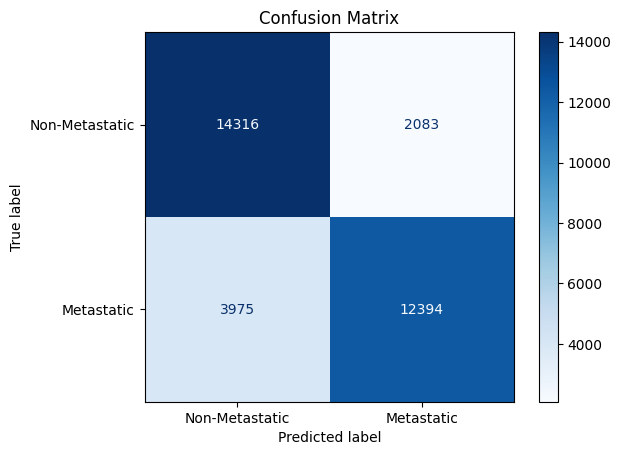

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def plot_confusion_matrix(model, dataset):
    y_true, y_pred = [], []
    for images, labels in dataset:
        preds = model.predict(images)
        preds = np.round(preds).astype(int).flatten()
        y_true.extend(labels.numpy())
        y_pred.extend(preds)

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Non-Metastatic', 'Metastatic'])
    disp.plot(cmap='Blues')
    plt.title('Confusion Matrix')
    plt.show()

# Run after training
plot_confusion_matrix(custom_mmsen_model, ds_test)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━

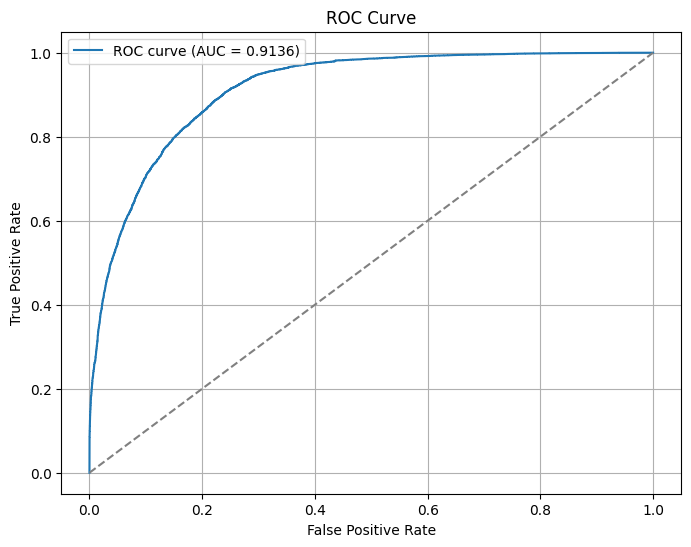

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score

def plot_roc_curve(model, dataset):
    y_true, y_scores = [], []
    for images, labels in dataset:
        preds = model.predict(images).flatten()
        y_scores.extend(preds)
        y_true.extend(labels.numpy())

    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    auc_score = roc_auc_score(y_true, y_scores)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (AUC = {auc_score:.4f})')
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend()
    plt.grid()
    plt.show()

# Run after training
plot_roc_curve(custom_mmsen_model, ds_test)


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
2/2 ━━━━━━━━

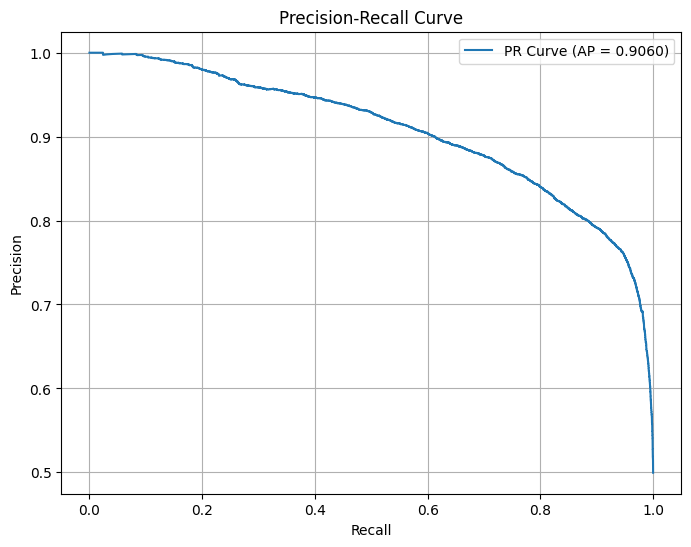

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

def plot_precision_recall_curve(model, dataset):
    y_true, y_scores = [], []
    for images, labels in dataset:
        preds = model.predict(images).flatten()
        y_scores.extend(preds)
        y_true.extend(labels.numpy())

    precision, recall, thresholds = precision_recall_curve(y_true, y_scores)
    ap_score = average_precision_score(y_true, y_scores)

    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, label=f'PR Curve (AP = {ap_score:.4f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend()
    plt.grid()
    plt.show()

# Run after training
plot_precision_recall_curve(custom_mmsen_model, ds_test)


In [ ]:
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 19.2 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
import numpy as np
import cv2

def generate_grad_cam(model, image, last_conv_layer_name):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(np.array([image]))
        loss = predictions[:, 0]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs.numpy()[0]
    pooled_grads = pooled_grads.numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0) / np.max(conv_outputs)

    heatmap = cv2.resize(heatmap, (96, 96))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    superimposed_img = heatmap * 0.4 + (image * 255)
    superimposed_img = np.clip(superimposed_img / superimposed_img.max(), 0, 1)

    return superimposed_img


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor']]
Received: inputs=Tensor(shape=(1, 96, 96, 3))
  warnings.warn(msg)


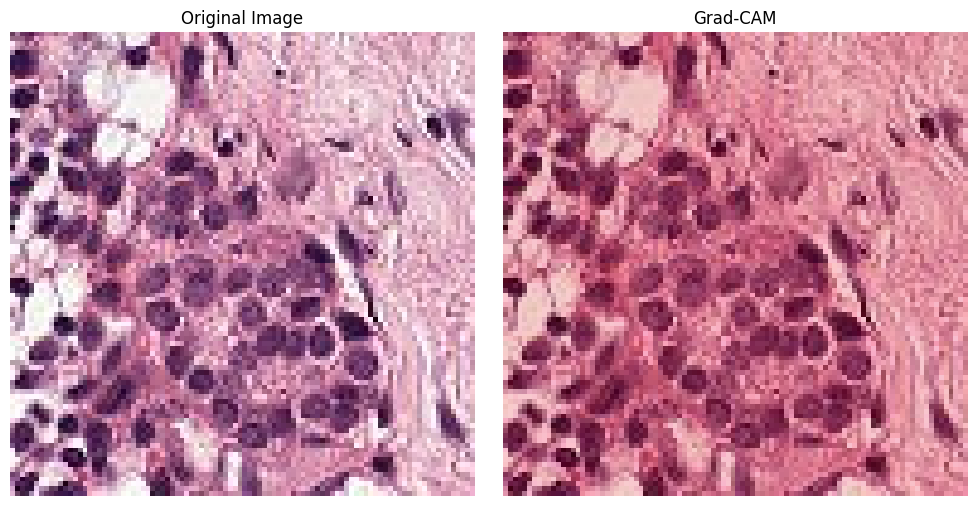

In [ ]:
import matplotlib.pyplot as plt

# Example usage (clearly run with one test image)
for images, labels in ds_test.take(1):
    image = images[0].numpy()
    grad_cam_result = generate_grad_cam(custom_mmsen_model, image, last_conv_layer_name='conv2d_2')

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(grad_cam_result)
    plt.title('Grad-CAM')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
custom_mmsen_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 96, 96, 3)      │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 96, 96, 32)     │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 96, 96, 32)     │          2,432 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 96, 96, 32)     │          4,736 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 96, 96, 96)     │              0 │ conv2d[0][0],          │
│                           │                        │                │ conv2d_1[0][0],        │
│                           │                        │                │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d  │ (None, 96)             │              0 │ concatenate[0][0]      │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 48)             │          4,656 │ global_average_poolin… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 96)             │          4,704 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 1, 1, 96)       │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply (Multiply)       │ (None, 96, 96, 96)     │              0 │ concatenate[0][0],     │
│                           │                        │                │ reshape[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d… │ (None, 96)             │              0 │ multiply[0][0]         │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 1)              │             97 │ global_average_poolin… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 52,565 (205.34 KB)

 Trainable params: 17,521 (68.44 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 35,044 (136.89 KB)

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds

# Load small demo subset (20 images) from the test set
demo_dataset = ds_test.unbatch().take(20).batch(1)

In [ ]:
import numpy as np

predictions = []
true_labels = []

for img, label in demo_dataset:
    pred = custom_mmsen_model.predict(img)
    predictions.append(np.round(pred).astype(int).flatten()[0])
    true_labels.append(label.numpy().flatten()[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


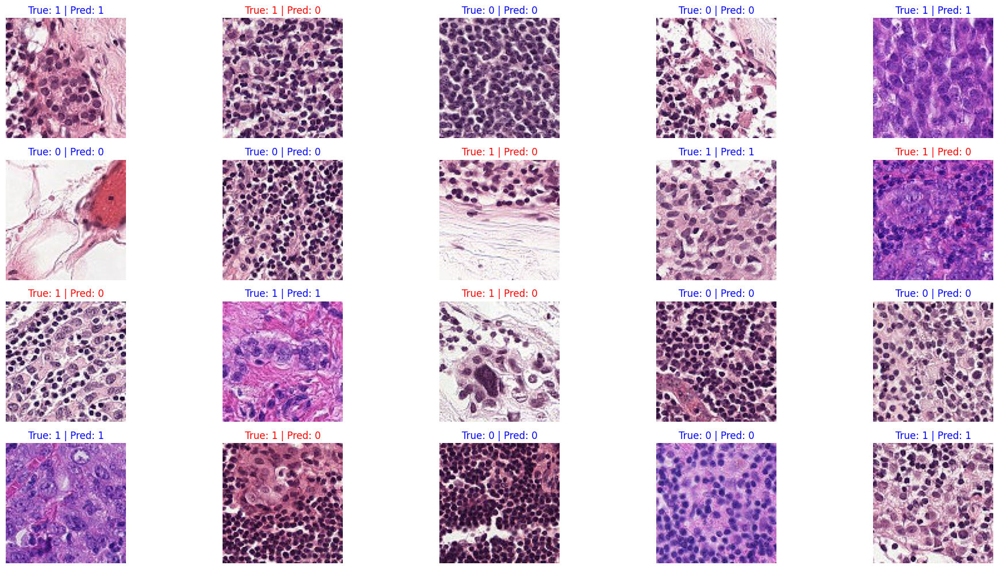

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
for i, (img_batch, pred, true_label) in enumerate(zip(demo_dataset, predictions, true_labels)):
    image = img_batch[0].numpy().squeeze()
    plt.subplot(4, 5, i + 1)
    plt.imshow(image)
    plt.title(f"True: {true_label} | Pred: {pred}", fontsize=12, color="blue" if pred==true_label else "red")
    plt.axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


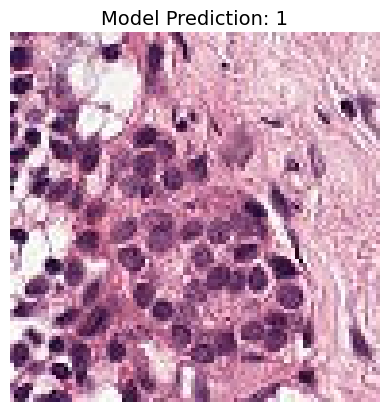

In [ ]:
# Interactive prediction function clearly for demo purposes
def predict_single_image(model, image):
    pred = model.predict(tf.expand_dims(image, axis=0))
    pred_label = int(np.round(pred).flatten()[0])

    plt.imshow(image)
    plt.title(f"Model Prediction: {pred_label}", fontsize=14)
    plt.axis('off')
    plt.show()

# Clearly pick a random image from your demo set for interactive demonstration
for img, label in demo_dataset.take(1):
    predict_single_image(custom_mmsen_model, img.numpy()[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


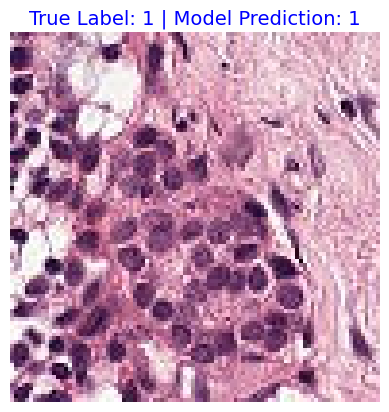

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


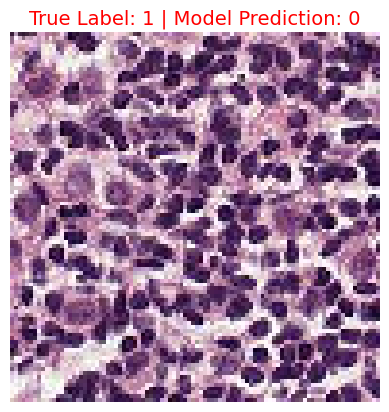

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


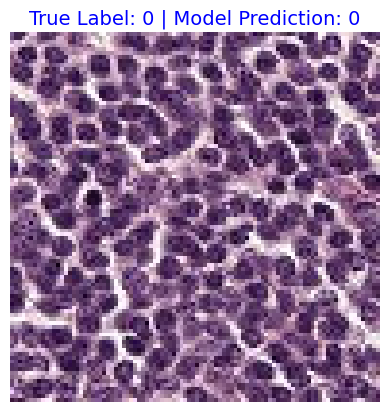

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


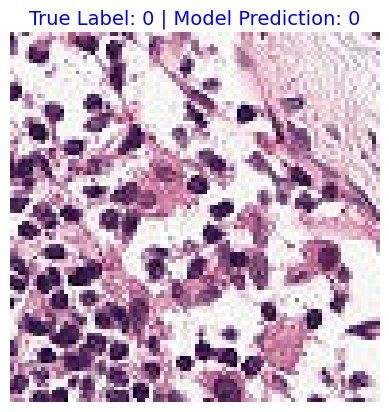

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Interactive prediction function showing both true and predicted labels
def predict_single_image(model, image, true_label):
    pred = model.predict(tf.expand_dims(image, axis=0))
    pred_label = int(np.round(pred).flatten()[0])

    plt.imshow(image)
    plt.title(f"True Label: {true_label} | Model Prediction: {pred_label}",
              fontsize=14,
              color="blue" if pred_label == true_label else "red")
    plt.axis('off')
    plt.show()

# Clearly demonstrate predictions on 4 images interactively
for img_batch, label_batch in demo_dataset.take(4):
    image = img_batch[0].numpy().squeeze()
    true_label = label_batch.numpy()[0]
    predict_single_image(custom_mmsen_model, image, true_label)
